## Download data

In [1]:
import pandas as pd, numpy as np
from fastai.tabular.all import *
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

In [2]:
path = Path('amp-parkinsons-disease-progression-prediction')

In [6]:
import zipfile, kaggle

kaggle.api.competition_download_cli(str(path))
zipfile.ZipFile(f'{path}.zip').extractall(path)

path.ls(file_type='text')

100%|█████████████████████████████████████████████████████████████████████████████████████████| 16.1M/16.1M [00:01<00:00, 8.87MB/s]


(#5) [Path('amp-parkinsons-disease-progression-prediction/supplemental_clinical_data.csv'),Path('amp-parkinsons-disease-progression-prediction/train_clinical_data.csv'),Path('amp-parkinsons-disease-progression-prediction/train_proteins.csv'),Path('amp-parkinsons-disease-progression-prediction/public_timeseries_testing_util.py'),Path('amp-parkinsons-disease-progression-prediction/train_peptides.csv')]

### Peeking into the dataset

In [3]:
train_cdata = pd.read_csv(path/'train_clinical_data.csv')
print(train_cdata.shape)
print(train_cdata.nunique())
train_cdata.head()

(2615, 8)
visit_id                               2615
patient_id                              248
visit_month                              17
updrs_1                                  32
updrs_2                                  36
updrs_3                                  72
updrs_4                                  19
upd23b_clinical_state_on_medication       2
dtype: int64


,visit_id,patient_id,visit_month,updrs_1,updrs_2,updrs_3,updrs_4,upd23b_clinical_state_on_medication
0,55_0,55,0,10.0,6.0,15.0,NaN,NaN
1,55_3,55,3,10.0,7.0,25.0,NaN,NaN
2,55_6,55,6,8.0,10.0,34.0,NaN,NaN
3,55_9,55,9,8.0,9.0,30.0,0.0,On
4,55_12,55,12,10.0,10.0,41.0,0.0,On


In [4]:
train_peptides = pd.read_csv(path/'train_peptides.csv')
print(train_peptides.shape)
print(train_peptides.nunique())
train_peptides.head()

(981834, 6)
visit_id              1113
visit_month             15
patient_id             248
UniProt                227
Peptide                968
PeptideAbundance    738931
dtype: int64


,visit_id,visit_month,patient_id,UniProt,Peptide,PeptideAbundance
0,55_0,0,55,O00391,NEQEQPLGQWHLS,11254.3
1,55_0,0,55,O00533,GNPEPTFSWTK,102060.0
2,55_0,0,55,O00533,IEIPSSVQQVPTIIK,174185.0
3,55_0,0,55,O00533,KPQSAVYSTGSNGILLC(UniMod_4)EAEGEPQPTIK,27278.9
4,55_0,0,55,O00533,SMEQNGPGLEYR,30838.7


In [5]:
train_proteins = pd.read_csv(path/'train_proteins.csv')
print(train_proteins.shape)
print(train_proteins.nunique())
train_proteins.head()

(232741, 5)
visit_id         1113
visit_month        15
patient_id        248
UniProt           227
NPX            218795
dtype: int64


,visit_id,visit_month,patient_id,UniProt,NPX
0,55_0,0,55,O00391,11254.3
1,55_0,0,55,O00533,732430.0
2,55_0,0,55,O00584,39585.8
3,55_0,0,55,O14498,41526.9
4,55_0,0,55,O14773,31238.0


In [6]:
train_supp = pd.read_csv(path/'supplemental_clinical_data.csv')
print(train_supp.shape)
print(train_supp.nunique())
train_supp.head()

(2223, 8)
visit_id                               2223
patient_id                              771
visit_month                               8
updrs_1                                  28
updrs_2                                  29
updrs_3                                  70
updrs_4                                  12
upd23b_clinical_state_on_medication       2
dtype: int64


,visit_id,patient_id,visit_month,updrs_1,updrs_2,updrs_3,updrs_4,upd23b_clinical_state_on_medication
0,35_0,35,0,5.0,3.0,16.0,0.0,NaN
1,35_36,35,36,6.0,4.0,20.0,0.0,NaN
2,75_0,75,0,4.0,6.0,26.0,0.0,NaN
3,75_36,75,36,1.0,8.0,38.0,0.0,On
4,155_0,155,0,NaN,NaN,0.0,NaN,NaN


Early thoughts:

1. We are suppose to predict the UPDRS - Unified Parkinson Disease Raating Scale for a patient based on the visit. AND their UPDRS for the next visits - 6, 12, 24 months after that visit.
- The first part should be predicted based on the first 3 CSVs - with `patient_id`'s of 248. 
- The second part should be predicted based on the `supplementary clinical data` with 771 patients and the `train clinical data` of the training set as the `patient_id`'s in both datasets are not repeated.

2. We have to find a way to stitch the patient's visits together for each one chronologically. 
- Use `visit_month`, the month of the patient's visit relative to the patient's first visit.
- from the clinical data check which patient's are performing worse over time and group them. 
- Use peptide and protein information to associate with the patient's future UPDRS scores.


In [22]:
train_cdata['visit_month'].unique()

array([  0,   3,   6,   9,  12,  18,  24,  30,  36,  42,  48,  54,  60,
        72,  84,  96, 108])

In [36]:
train_cdata['upd23b_clinical_state_on_medication'].unique()

array([nan, 'On', 'Off'], dtype=object)

In [9]:
train_cdata['upd23b_clinical_state_on_medication'] = train_cdata['upd23b_clinical_state_on_medication'].replace({'On': 1, 'Off': 0})
train_cdata['upd23b_clinical_state_on_medication'].unique()

array([nan,  1.,  0.])

/Users/joshuateh/mambaforge/lib/python3.10/site-packages/pandas/plotting/_matplotlib/core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


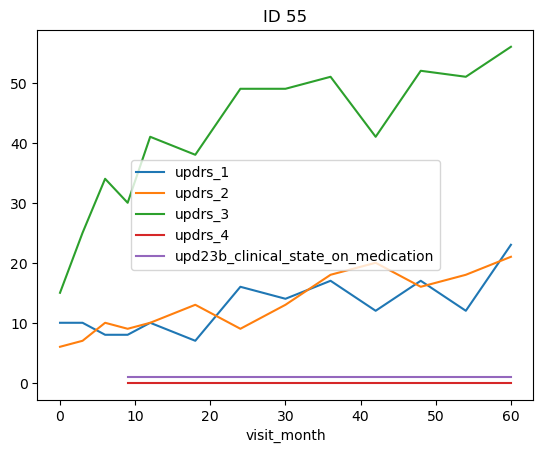

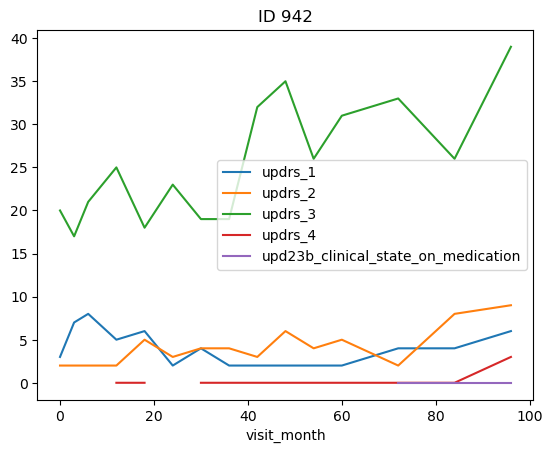

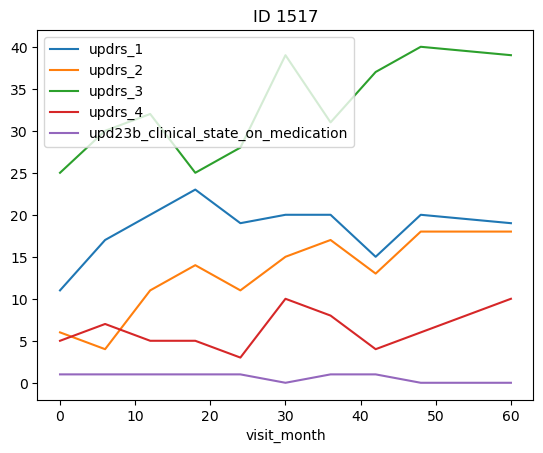

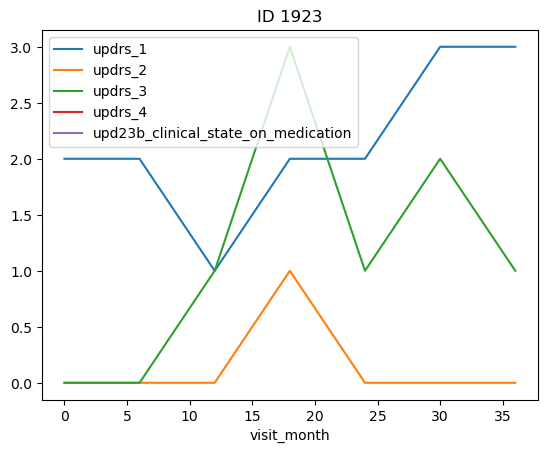

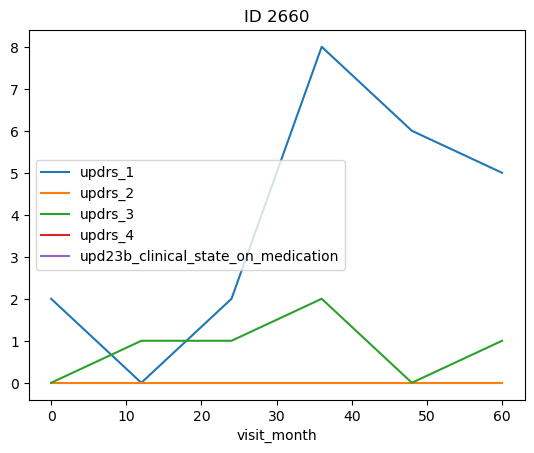

...

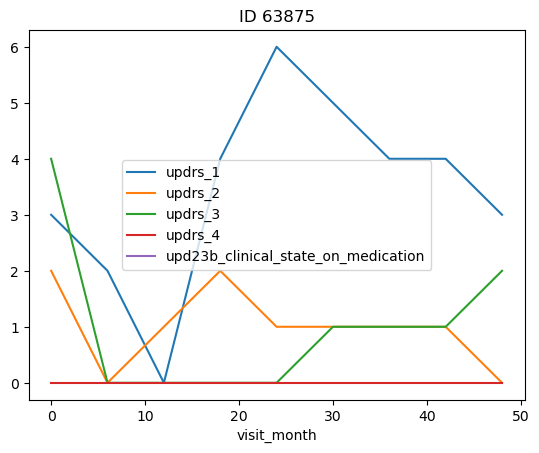

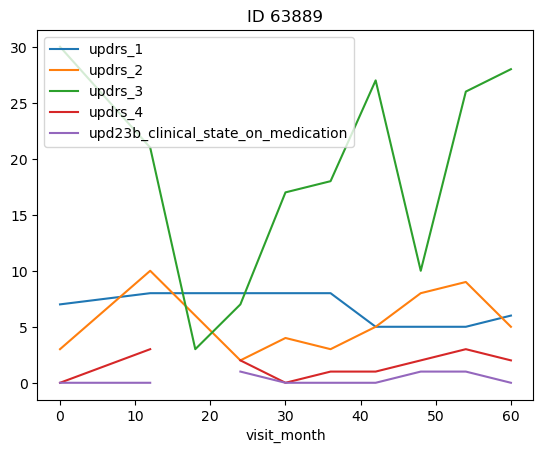

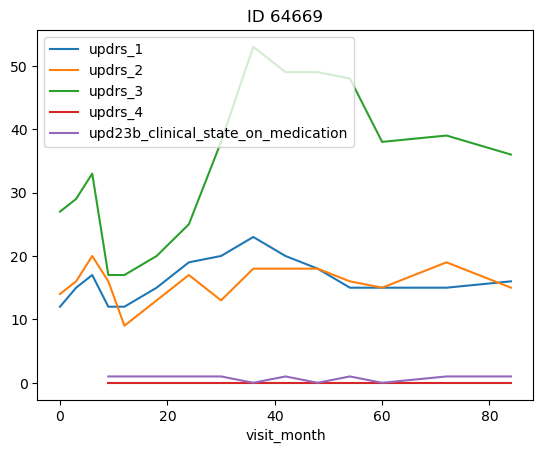

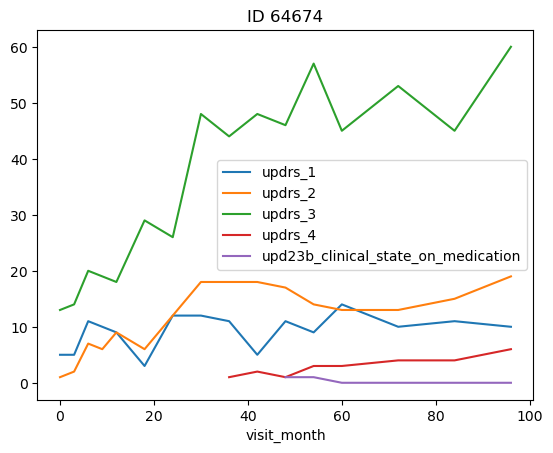

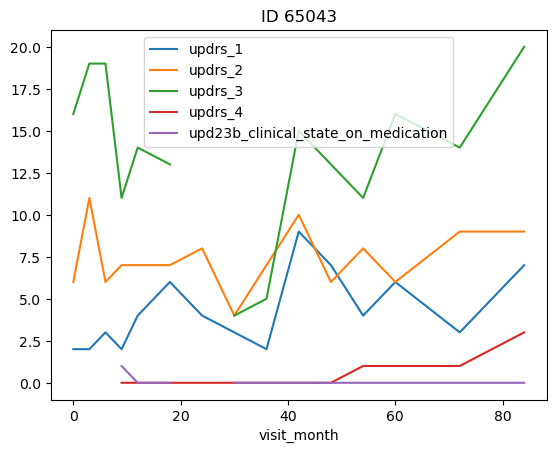

In [40]:
groups = train_cdata.groupby('patient_id')
for name, group in groups:
    group.plot(x='visit_month', y=['updrs_1','updrs_2','updrs_3','updrs_4','upd23b_clinical_state_on_medication'], kind='line', title=f'ID {name}')
    
plt.show()

Exploration Notes:

1. UPDRS score is an evaluation on a PD patient's condition on motor and non-motor symptoms.
- UPDRS 1: Mentation, Behavior, Mood (Non-motor experiences of daily living) - self evaluation (<10 mild, >22 severe, range: 0-52)
- UPDRS 2: Activities of Daily Living (Motor expereinces of daily living) - self evaluation (<12 mild, >30 severe, range: 0-52)
- UPDRS 3: Motor Examintation - Doctor's evaluation (Highest correlation to medication) (<32 mild, >59 severe, range: 0-132)
- UPDRS 4: Complications of Therapy - Doctor's evaluation (<4 mild, >13 severe, range: 0-24)
The higher the score the more severe the syptoms are in the patient.

2. Within the clinical dataset of 248 patients there exist patients who do not have PD, the y-scale is an immediate indicator if a patient has PD.

3. Peptides and proteins are amino acids, the distiction between them are peptides are shorter chains (2 to 50 amino acids) while proteins are longer chaind (>50 amino acides) and have three-dimentional structures. Main difference are size and complexity. 
- Peptides play a role in hormones, neurotransmitters and enzymes inhibitors.
- Proteins play a bigger role in biological functions like catalyaing chemical reactions, transporting molecules within cells, providing structural support to cells and tissue. 

4. UniProt (Universal Protein Resource) is an publically accessible database of protein sequences and function data, which is maintained by a consortium of international organizations. 
- Protein data includes a wide variety of organisms including bacteria, viruses, plant, fungi, and animals. 

5. Peptides and Proteins in our dataset contains Uniprot IDs.
- Multiple peptides can be represented by the same UniProt ID, the are listed along with the peptide abundance for each one. 
- Whereas, our protein dataset only lists the UniProt ID and the NPX (Normalized protein expression - a measure of concentration).


### Identifying the Age-Matched Control Individuals

It is worth splitting out or identifying the individuals who do not have the disease. This will allow us to:
- Understand our dataset better
- Compare peptide levels for high importance features


In [11]:
VISIT_IDS = train_cdata['visit_id'].unique()
PEPTIDES = train_peptides['Peptide'].unique()

In [12]:
DEP_VAR = ['updrs_1','updrs_2','updrs_3','updrs_4']

In [19]:
tdata = train_cdata.set_index('visit_id')
tdata

,patient_id,visit_month,updrs_1,updrs_2,updrs_3,updrs_4,upd23b_clinical_state_on_medication
visit_id,,,,,,,
55_0,55,0,10.0,6.0,15.0,NaN,NaN
55_3,55,3,10.0,7.0,25.0,NaN,NaN
55_6,55,6,8.0,10.0,34.0,NaN,NaN
55_9,55,9,8.0,9.0,30.0,0.0,1.0
55_12,55,12,10.0,10.0,41.0,0.0,1.0
...,...,...,...,...,...,...,...
65043_48,65043,48,7.0,6.0,13.0,0.0,0.0
65043_54,65043,54,4.0,8.0,11.0,1.0,0.0
65043_60,65043,60,6.0,6.0,16.0,1.0,0.0


In [60]:
tdata['updrs_sum'] = tdata[DEP_VAR].sum(axis=1)
tdata['PD'] = tdata['updrs_sum']>20
tdata.PD.sum()/2615

0.6684512428298279

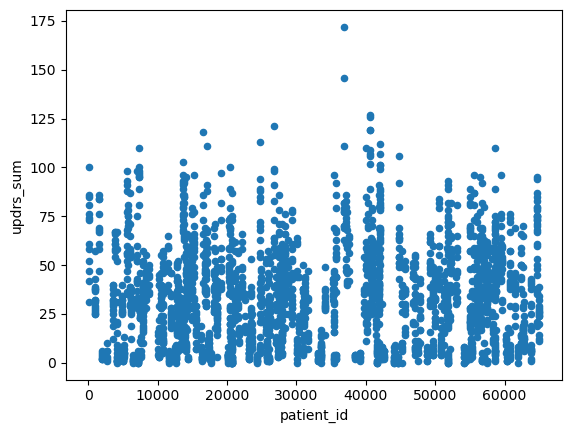

In [50]:
tdata.plot(x='patient_id', y='updrs_sum', kind='scatter')
plt.show()

### Feature Importance Plot

Let's build a Feature Importance plot on the Peptide and Protein concetrations to each UPDRS score from our data.

In [48]:
train_peptides

,visit_id,visit_month,patient_id,UniProt,Peptide,PeptideAbundance
0,55_0,0,55,O00391,NEQEQPLGQWHLS,11254.30
1,55_0,0,55,O00533,GNPEPTFSWTK,102060.00
2,55_0,0,55,O00533,IEIPSSVQQVPTIIK,174185.00
3,55_0,0,55,O00533,KPQSAVYSTGSNGILLC(UniMod_4)EAEGEPQPTIK,27278.90
4,55_0,0,55,O00533,SMEQNGPGLEYR,30838.70
...,...,...,...,...,...,...
981829,58648_108,108,58648,Q9UHG2,ILAGSADSEGVAAPR,202820.00
981830,58648_108,108,58648,Q9UKV8,SGNIPAGTTVDTK,105830.00
981831,58648_108,108,58648,Q9Y646,LALLVDTVGPR,21257.60
981832,58648_108,108,58648,Q9Y6R7,AGC(UniMod_4)VAESTAVC(UniMod_4)R,5127.26


In [62]:
tpep = train_peptides.pivot(index='visit_id', columns='Peptide', values='PeptideAbundance')
tpep = tpep.reindex(VISIT_IDS)
tpep = tpep[PEPTIDES]

In [110]:
tpep

Peptide,NEQEQPLGQWHLS,GNPEPTFSWTK,IEIPSSVQQVPTIIK,KPQSAVYSTGSNGILLC(UniMod_4)EAEGEPQPTIK,SMEQNGPGLEYR,TLKIENVSYQDKGNYR,VIAVNEVGR,VMTPAVYAPYDVK,VNGSPVDNHPFAGDVVFPR,ELDLNSVLLK,...,QALPQVR,SGNIPAGTTVDTK,RLGMFNIQHC(UniMod_4)K,EPQVYTLPPSRDELTK,PALEDLR,QKVEPLRAELQEGAR,RTHLPEVFLSK,INHC(UniMod_4)RFDEFFSEGC(UniMod_4)APGSKK,EQPPSLTR,AGC(UniMod_4)VAESTAVC(UniMod_4)R
visit_id,,,,,,,,,,,,,,,,,,,,,
55_0,11254.3,102060.0,174185.0,27278.9,30838.7,23216.5,170878.0,148771.0,55202.1,27229.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
55_3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
55_6,13163.6,90643.1,147434.0,24320.6,25532.9,21884.6,152910.0,118982.0,48758.2,23305.4,...,NaN,NaN,NaN,NaN,50231.1,2588340.0,NaN,455333.0,NaN,NaN
55_9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
55_12,15257.6,114433.0,194848.0,34090.4,30140.5,29528.6,184855.0,172592.0,54596.9,28367.0,...,25589.4,65762.6,NaN,NaN,24770.9,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65043_48,10589.6,121863.0,258539.0,38971.5,40706.7,31764.8,196490.0,151323.0,62777.2,29945.6,...,14019.1,39046.7,632373.0,NaN,48933.1,2593040.0,117.149,461598.0,16228.5,11124.1
65043_54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
65043_60,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [98]:
tdata = train_cdata.set_index('visit_id')
updrs1 = pd.concat([tpep,tdata['updrs_1']], axis=1)
updrs1 = updrs1.dropna(subset=updrs1.columns.difference(['updrs_1']), how='all')
updrs1 = updrs1.fillna(updrs1.mean())

In [118]:
updrs1

,NEQEQPLGQWHLS,GNPEPTFSWTK,IEIPSSVQQVPTIIK,KPQSAVYSTGSNGILLC(UniMod_4)EAEGEPQPTIK,SMEQNGPGLEYR,TLKIENVSYQDKGNYR,VIAVNEVGR,VMTPAVYAPYDVK,VNGSPVDNHPFAGDVVFPR,ELDLNSVLLK,...,SGNIPAGTTVDTK,RLGMFNIQHC(UniMod_4)K,EPQVYTLPPSRDELTK,PALEDLR,QKVEPLRAELQEGAR,RTHLPEVFLSK,INHC(UniMod_4)RFDEFFSEGC(UniMod_4)APGSKK,EQPPSLTR,AGC(UniMod_4)VAESTAVC(UniMod_4)R,updrs_1
visit_id,,,,,,,,,,,,,,,,,,,,,
55_0,11254.300000,102060.0,174185.000000,27278.9,30838.7,23216.50,170878.0,148771.000000,55202.100000,27229.3,...,69986.346402,643685.05645,681764.959184,41233.447365,2.488197e+06,109.25325,514629.050154,15612.705079,7657.330128,10.0
55_6,13163.600000,90643.1,147434.000000,24320.6,25532.9,21884.60,152910.0,118982.000000,48758.200000,23305.4,...,69986.346402,643685.05645,681764.959184,50231.100000,2.588340e+06,109.25325,455333.000000,15612.705079,7657.330128,8.0
55_12,15257.600000,114433.0,194848.000000,34090.4,30140.5,29528.60,184855.0,172592.000000,54596.900000,28367.0,...,65762.600000,643685.05645,681764.959184,24770.900000,2.488197e+06,109.25325,514629.050154,15612.705079,7657.330128,10.0
55_36,13530.800000,120904.0,161969.000000,25936.8,37848.4,27058.90,164386.0,166703.000000,49026.200000,28379.8,...,74976.100000,643685.05645,681764.959184,42443.300000,3.252770e+06,109.25325,514629.050154,15612.705079,7657.330128,17.0
942_6,11218.700000,44187.4,106295.000000,17013.7,15552.1,15239.10,77440.0,94832.400000,28957.800000,14231.4,...,82335.500000,643685.05645,673195.000000,65238.600000,3.894970e+06,158.86900,396983.000000,23833.800000,5138.820000,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64674_84,11605.680568,34329.6,81002.200000,11527.8,11171.1,9846.12,42610.5,109811.621392,42540.515073,19603.1,...,62217.500000,666078.00000,563260.000000,39740.600000,2.836950e+06,99.48550,496292.000000,12672.200000,4050.660000,11.0
65043_0,13472.400000,158777.0,145063.276733,51184.3,55708.4,53159.70,301939.0,224293.000000,82892.200000,22158.6,...,37584.600000,686180.00000,681764.959184,35285.500000,2.441490e+06,130.81800,471678.000000,18237.900000,12057.700000,2.0
65043_12,14134.900000,126575.0,296011.000000,44624.9,44012.3,37695.20,186724.0,180328.000000,68679.600000,28990.8,...,40588.900000,583958.00000,681764.959184,52361.200000,2.502760e+06,125.61900,449807.000000,15904.300000,13027.800000,4.0


In [77]:
def smape(forecast, actual):
    dividend = np.abs(np.array(actual) - np.array(forecast))
    denominator = np.array(actual) + np.array(forecast)
    return 100 * np.mean(2 * dividend / denominator)


### UPDRS1

In [119]:
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(updrs1, test_size=0.2, random_state=42)

In [120]:
train_df.shape, test_df.shape

((854, 969), (214, 969))

In [121]:
test_df

,NEQEQPLGQWHLS,GNPEPTFSWTK,IEIPSSVQQVPTIIK,KPQSAVYSTGSNGILLC(UniMod_4)EAEGEPQPTIK,SMEQNGPGLEYR,TLKIENVSYQDKGNYR,VIAVNEVGR,VMTPAVYAPYDVK,VNGSPVDNHPFAGDVVFPR,ELDLNSVLLK,...,SGNIPAGTTVDTK,RLGMFNIQHC(UniMod_4)K,EPQVYTLPPSRDELTK,PALEDLR,QKVEPLRAELQEGAR,RTHLPEVFLSK,INHC(UniMod_4)RFDEFFSEGC(UniMod_4)APGSKK,EQPPSLTR,AGC(UniMod_4)VAESTAVC(UniMod_4)R,updrs_1
visit_id,,,,,,,,,,,,,,,,,,,,,
41883_6,11605.680568,42481.2,63431.500000,13818.4,15760.4,15974.80000,67030.3,57757.8,24874.1,7019.610000,...,72119.8,7.448770e+05,760932.000000,58457.900000,4015530.0,99.30900,551388.000000,12162.3,5122.930000,4.0
14242_0,11605.680568,57625.1,114536.000000,18719.5,23736.2,20983.80163,107512.0,118258.0,38551.3,20263.756708,...,54381.5,5.030690e+05,681764.959184,30039.600000,1860490.0,122.43100,464356.000000,11798.2,7657.330128,8.0
55662_12,14867.900000,153620.0,145063.276733,44195.6,53079.5,36211.60000,193941.0,202411.0,88132.0,42645.100000,...,93395.0,5.194400e+05,681764.959184,48115.700000,2512870.0,52.12270,434550.000000,12939.3,7657.330128,5.0
7117_48,15639.000000,57977.4,124181.000000,18109.4,15503.9,13669.30000,71672.7,75182.8,25556.4,20263.756708,...,72541.7,6.436851e+05,681764.959184,23304.600000,1283060.0,112.60900,322988.000000,16666.6,6449.370000,1.0
49672_0,10865.500000,107556.0,136306.000000,29901.6,35862.6,29844.60000,152046.0,182697.0,59035.3,22532.200000,...,105773.0,1.030190e+06,767579.000000,60253.900000,4563300.0,151.49200,622679.000000,22514.5,10902.600000,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26005_24,11605.680568,45234.8,62708.300000,15254.9,15565.8,14275.60000,59684.0,33798.7,26658.5,17113.100000,...,79925.5,9.469360e+05,510585.000000,42542.500000,2468550.0,135.92600,374630.000000,23253.7,7257.030000,2.0
35477_24,9202.370000,68103.5,125900.000000,23268.4,22320.1,18932.30000,82786.1,95971.8,43852.6,17158.100000,...,59122.7,6.043490e+05,681764.959184,45240.500000,2968890.0,99.25860,413987.000000,12360.8,6081.410000,0.0
40022_24,11605.680568,61698.8,121376.000000,20357.1,21299.9,19304.50000,73426.1,83299.5,35284.5,19842.800000,...,44896.7,4.449600e+05,494374.000000,41233.447365,2397560.0,84.42290,364357.000000,15868.4,7657.330128,15.0


In [151]:
train_xs = train_df[PEPTIDES]
train_y = train_df['updrs_1']
valid_xs = test_df[PEPTIDES]
valid_y = test_df['updrs_1']

In [185]:
from sklearn.ensemble import RandomForestRegressor

def rf(xs, y, n_estimators=100, max_samples=round(854*.8),
       max_features=0.5, min_samples_leaf=5, **kwargs):
    return RandomForestRegressor(n_jobs=-1, n_estimators=n_estimators,
                                  max_samples=max_samples, max_features=max_features,
                                  min_samples_leaf=min_samples_leaf, oob_score=True).fit(xs, y)

In [186]:
m = rf(train_xs, train_y)

In [187]:
smape(m.predict(train_xs), train_y), smape(m.predict(valid_xs), valid_y)

(46.40028824504153, 68.20251330969515)

In [178]:
def rf_feat_importance(m, df):
    return pd.DataFrame({'cols':df.columns, 'imp':m.feature_importances_}
                       ).sort_values('imp', ascending=False)

fi = rf_feat_importance(m, train_xs)

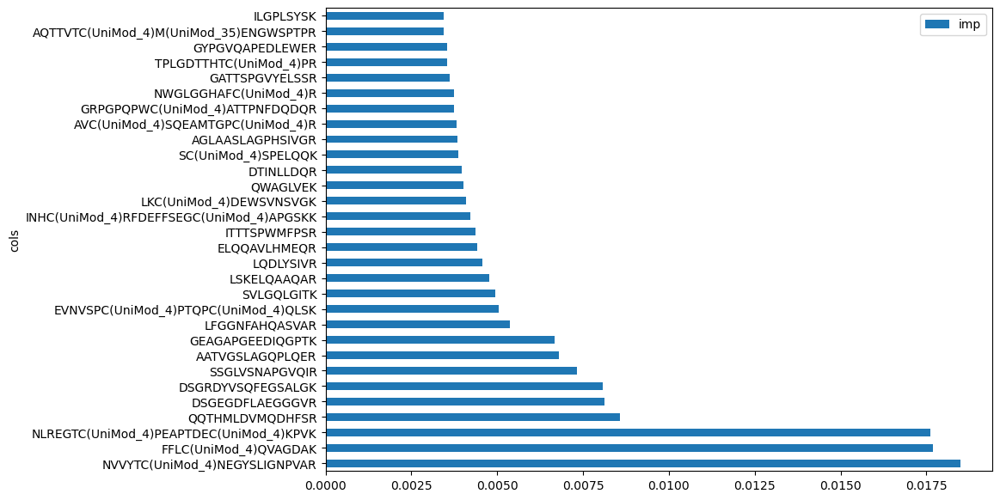

In [190]:
def plot_fi(fi):
    return fi.plot('cols', 'imp', 'barh', figsize=(10,7))

plot_fi(fi[:30]);

In [197]:
def getUniProt(Peptide):
    return train_peptides.loc[(train_peptides['Peptide']==Peptide), 'UniProt'].iloc[0]

In [198]:
getUniProt('NVVYTC(UniMod_4)NEGYSLIGNPVAR')

'P10643'

### UPDRS2

In [226]:
tdata = train_cdata.set_index('visit_id')
updrs2 = pd.concat([tpep,tdata['updrs_2']], axis=1)
updrs2 = updrs2.dropna(subset=updrs2.columns.difference(['updrs_2']), how='all')
updrs2 = updrs2.fillna(updrs2.mean())

In [227]:
train_df, test_df = train_test_split(updrs2, test_size=0.2, random_state=42)

In [228]:
train_xs = train_df[PEPTIDES]
train_y = train_df['updrs_2']
valid_xs = test_df[PEPTIDES]
valid_y = test_df['updrs_2']

In [230]:
m = rf(train_xs, train_y)
smape(m.predict(train_xs), train_y), smape(m.predict(valid_xs), valid_y)

(69.82573297115992, 99.67078045022424)

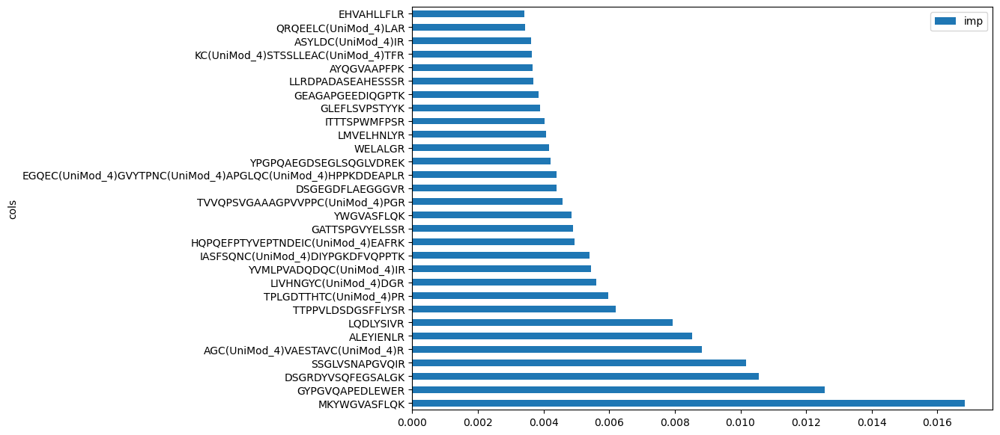

In [231]:
fi = rf_feat_importance(m, train_xs)
plot_fi(fi[:30]);

### UPDRS3

In [217]:
tdata = train_cdata.set_index('visit_id')
updrs3 = pd.concat([tpep,tdata['updrs_3']], axis=1)
updrs3 = updrs3.dropna(subset=updrs3.columns.difference(['updrs_3']), how='all')
updrs3 = updrs3.fillna(updrs3.mean())

In [218]:
train_df, test_df = train_test_split(updrs3, test_size=0.2, random_state=42)

In [219]:
train_xs = train_df[PEPTIDES]
train_y = train_df['updrs_3']
valid_xs = test_df[PEPTIDES]
valid_y = test_df['updrs_3']

In [220]:
m = rf(train_xs, train_y)
smape(m.predict(train_xs), train_y), smape(m.predict(valid_xs), valid_y)

(61.53099287221884, 88.27088859227513)

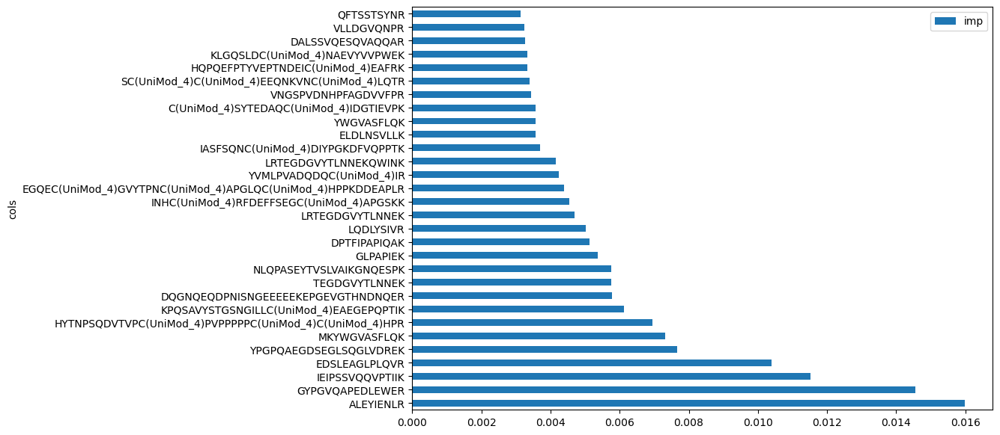

In [221]:
fi = rf_feat_importance(m, train_xs)
plot_fi(fi[:30]);

### UPDRS4

In [234]:
tdata = train_cdata.set_index('visit_id')
updrs4 = pd.concat([tpep,tdata['updrs_4']], axis=1)
updrs4 = updrs4.dropna(subset=updrs4.columns.difference(['updrs_4']), how='all')
updrs4 = updrs4.fillna(updrs4.mean())

In [235]:
train_df, test_df = train_test_split(updrs4, test_size=0.2, random_state=42)

In [236]:
train_xs = train_df[PEPTIDES]
train_y = train_df['updrs_4']
valid_xs = test_df[PEPTIDES]
valid_y = test_df['updrs_4']

In [237]:
m = rf(train_xs, train_y)
smape(m.predict(train_xs), train_y), smape(m.predict(valid_xs), valid_y)

(79.60186130578924, 76.17822403306383)

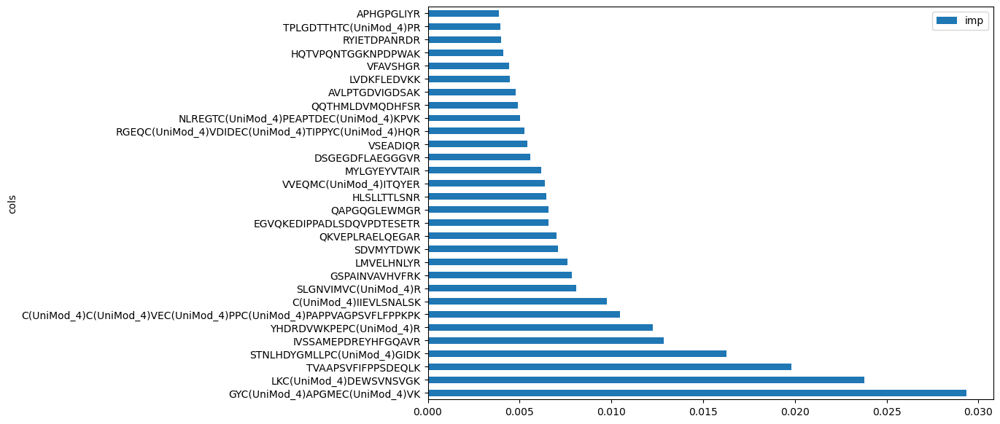

In [238]:
fi = rf_feat_importance(m, train_xs)
plot_fi(fi[:30]);

### Combination RF

In [241]:
train_cdata

,visit_id,patient_id,visit_month,updrs_1,updrs_2,updrs_3,updrs_4,upd23b_clinical_state_on_medication
0,55_0,55,0,10.0,6.0,15.0,NaN,NaN
1,55_3,55,3,10.0,7.0,25.0,NaN,NaN
2,55_6,55,6,8.0,10.0,34.0,NaN,NaN
3,55_9,55,9,8.0,9.0,30.0,0.0,On
4,55_12,55,12,10.0,10.0,41.0,0.0,On
...,...,...,...,...,...,...,...,...
2610,65043_48,65043,48,7.0,6.0,13.0,0.0,Off
2611,65043_54,65043,54,4.0,8.0,11.0,1.0,Off
2612,65043_60,65043,60,6.0,6.0,16.0,1.0,Off
2613,65043_72,65043,72,3.0,9.0,14.0,1.0,Off


In [86]:
tdata = train_cdata.set_index('visit_id')
tdata = tdata.drop(['patient_id','visit_month'], axis=1)
tdata = tdata.fillna(0)
updrst = pd.concat([tpep,tdata], axis=1)
updrst = updrst.dropna(subset=PEPTIDES, how='all')
updrst = updrst.fillna(updrst.mean())

In [87]:
cont = updrst.columns.tolist()
cont.remove('upd23b_clinical_state_on_medication')
cat = ['upd23b_clinical_state_on_medication']

In [88]:
procs = [Categorify, FillMissing]
splits = RandomSplitter(valid_pct=0.2)(range_of(updrst))
#cont,cat = cont_cat_split(updrst, 1, dep_var=DEP_VAR)
updrs_to = TabularPandas(updrst, procs, cat, cont, y_names=DEP_VAR, y_block=RegressionBlock, splits=splits)

In [89]:
train_xs, train_ys = updrs_to.train.xs, updrs_to.train.ys
valid_xs, valid_ys = updrs_to.valid.xs, updrs_to.valid.ys

In [90]:
train_xs = train_xs.drop(columns=DEP_VAR)
valid_xs = valid_xs.drop(columns=DEP_VAR)

In [136]:
from sklearn.multioutput import MultiOutputRegressor

m = MultiOutputRegressor(
    RandomForestRegressor(n_estimators=100,
                          max_samples=round(854*.8),
                          max_features=0.5,
                          min_samples_leaf=5)
).fit(train_xs, train_ys)

In [139]:
smape(m.predict(train_xs), train_ys), smape(m.predict(valid_xs), valid_ys)

(89.0825468367035, 102.50620033200933)

Fixing Smape:

I was getting NaN values for my SMAPE score after I called the fuction. Upon closer inspection, there were 47 values in the denominator for the column `updrs_4` that were zero, and dividing by zero returns NaN.

It it's suprising that the column would have zeros either as most `updrs_4` score, which indicates treatment complications in the training dataset were zero or NaN. 

To solve this we just added a small constant to the denominator calculation. 


In [138]:
def smape(forecast, actual):
    dividend = np.abs(np.array(actual) - np.array(forecast))
    denominator = np.array(actual) + np.array(forecast) + 0.0001
    return 100 * np.mean(2 * dividend / denominator)


Playing with Kaggle's time series API, I discovered the following:
- We will be predicting patient's updrs scores for 0, 6, 12, 24 months with the data of a single visit.
- That visit data will be given to us for the 0th month and the 6th month.
- We could potentially store the 0th month data to infer the 6th month predictions.
- Medication on/off column is not available i.e. `upd23b_clinical_state_on_medication`.

In [42]:
visit_count = pd.DataFrame(train_cdata.visit_month.value_counts()).sort_index()
visit_count = visit_count.rename(columns={'index':'visit_month', 'visit_month':'count'})

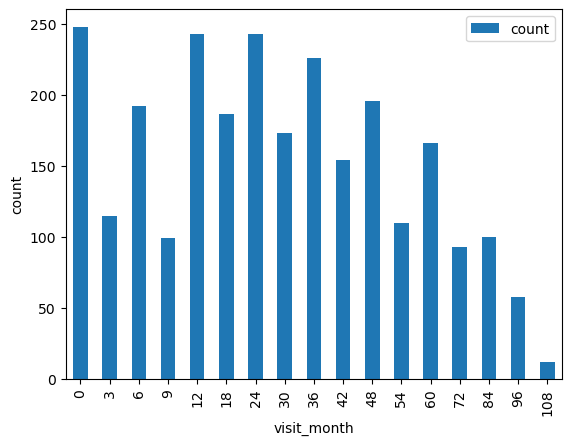

In [41]:
visit_count.plot(y='count', kind='bar')
plt.xlabel('visit_month')
plt.ylabel('count')
plt.show()

Technically, all this data can be used to train for the zeroth month.
Question is how many of these can be used to train for the 6th, 12th and 24th month.

To get the 6th month, I should take all the values here and check if a `visit_month - 6` exists in the dataset.

In [46]:
train_cdata['visit_month'][3]-6

3

In [47]:
train_cdata['patient_id'][0]

55

In [90]:
vtc = '{}_{}'.format(train_cdata['patient_id'][3],train_cdata['visit_month'][3]-6)
vtc

'55_3'

In [71]:
if train_cdata['visit_id'][3]=='55_0':
    print('yes')
else:
    print('no')


no


In [140]:
def sixmth(i):
    visit_to_check = '{}_{}'.format(train_cdata['patient_id'][i], train_cdata['visit_month'][i]-6)
    a = 0
    for x in range(i):
        if train_cdata['visit_id'][x]==visit_to_check:
            #print('yes')
            a = visit_to_check
            break
        #else:
            #print('no'+str(x))
    return a

In [141]:
sixmth(11)

'55_48'

In [169]:
tdata = pd.DataFrame(train_cdata['visit_id']).set_index('visit_id')
tdata[['-6mths', '-12mths', '-24mths']] = 0

In [171]:
def nthmth(i, nth):
    visit_to_check = '{}_{}'.format(train_cdata['patient_id'][i], train_cdata['visit_month'][i]-nth)
    a = 0
    for x in range(i):
        if train_cdata['visit_id'][x]==visit_to_check:
            #print('yes')
            a = visit_to_check
            break
        #else:
            #print('no'+str(x))
    return a

In [172]:
for x in range(len(tdata)):
    a = train_cdata['visit_id'][x]
    tdata.loc[a,'-6mths'] = nthmth(x,6)

In [173]:
for x in range(len(tdata)):
    a = train_cdata['visit_id'][x]
    tdata.loc[a,'-12mths'] = nthmth(x,12)

In [174]:
for x in range(len(tdata)):
    a = train_cdata['visit_id'][x]
    tdata.loc[a,'-24mths'] = nthmth(x,24)

In [175]:
tdata.nunique()

-6mths     1683
-12mths    1882
-24mths    1474
dtype: int64

In [168]:
tdata

,-6mths,-12mths,-24mths
visit_id,,,
55_0,0,0,0.0
55_3,0,0,0.0
55_6,55_0,0,0.0
55_9,55_3,0,0.0
55_12,55_6,55_0,0.0
...,...,...,...
65043_48,65043_42,65043_36,65043_24
65043_54,65043_48,65043_42,65043_30
65043_60,65043_54,65043_48,65043_36


So it appears we have this many rows to train each nth month in the future.
- 0th month: 2614 
- 6th month: 1682
- 12th month: 1881
- 24th month: 1473

In [177]:
import pandas as pd

# create sample dataframe
df = pd.DataFrame({'A': [1, 2, 3, 0, 5], 'B': [0, 0, 0, 4, 0]})

# get index values where column B is not 0
index_values = df.loc[df['A'] != 0].index

# print index values
print(index_values)


Int64Index([0, 1, 2, 4], dtype='int64')


In [178]:
index_values

Int64Index([0, 1, 2, 4], dtype='int64')